In [122]:
from tensorflow.keras.layers import Input, Dense, Dropout, Reshape, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.optimizers import Adam
import math
import numpy as np
import pandas as pd
import cv2
import os
import xml.etree.ElementTree as ET
from tensorflow.keras.utils import Sequence
from sklearn.model_selection import train_test_split
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.utils import resample

In [123]:
def load_rdd2022_dataset(root_folder):
    data = []

    for country_1 in os.listdir(root_folder):
        path_1 = os.path.join(root_folder, country_1)
        if not os.path.isdir(path_1):
            continue

        for country_2 in os.listdir(path_1):
            path_2 = os.path.join(path_1, country_2)
            if not os.path.isdir(path_2):
                continue

            train_path = os.path.join(path_2, 'train')
            images_path = os.path.join(train_path, 'images')
            annotations_path = os.path.join(train_path, 'annotations', 'xmls')

            if not os.path.exists(images_path) or not os.path.exists(annotations_path):
                continue

            for xml_file in os.listdir(annotations_path):
                if not xml_file.endswith('.xml'):
                    continue

                xml_path = os.path.join(annotations_path, xml_file)

                try:
                    tree = ET.parse(xml_path)
                    root = tree.getroot()
                    filename = root.find('filename').text
                    img_path = os.path.join(images_path, filename)

                    for obj in root.findall('object'):
                        label = obj.find('name').text.strip()
                        bbox = obj.find('bndbox')
                        xmin = int(float(bbox.find('xmin').text))
                        ymin = int(float(bbox.find('ymin').text))
                        xmax = int(float(bbox.find('xmax').text))
                        ymax = int(float(bbox.find('ymax').text))

                        data.append([img_path, xmin, ymin, xmax, ymax, label])
                except Exception as e:
                    print(f'❌ Error en {xml_path}: {e}')

    df = pd.DataFrame(data, columns=['image_path', 'xmin', 'ymin', 'xmax', 'ymax', 'label'])
    print(f"✅ RDD2022 dataset cargado: {len(df)} muestras")
    return df

In [124]:
from PIL import Image

def load_humans_dataset(root_folder):
    data = []

    for split in ['train', 'val']:
        images_path = os.path.join(root_folder, 'images', split)
        labels_path = os.path.join(root_folder, 'labels', split)

        if not os.path.exists(images_path) or not os.path.exists(labels_path):
            continue

        for label_file in os.listdir(labels_path):
            if not label_file.endswith('.txt'):
                continue

            label_path = os.path.join(labels_path, label_file)
            img_filename = os.path.splitext(label_file)[0] + '.jpg'
            img_path = os.path.join(images_path, img_filename)

            if not os.path.exists(img_path):
                img_filename = os.path.splitext(label_file)[0] + '.png'
                img_path = os.path.join(images_path, img_filename)
                if not os.path.exists(img_path):
                    print(f"⚠️ Imagen no encontrada para {label_path}")
                    continue

            with Image.open(img_path) as img:
                width, height = img.size

            with open(label_path, 'r') as f:
                for line in f:
                    parts = line.strip().split()
                    if len(parts) != 5:
                        continue

                    class_id = parts[0]
                    x_center_rel = float(parts[1])
                    y_center_rel = float(parts[2])
                    width_rel = float(parts[3])
                    height_rel = float(parts[4])

                    xmin = int((x_center_rel - width_rel / 2) * width)
                    ymin = int((y_center_rel - height_rel / 2) * height)
                    xmax = int((x_center_rel + width_rel / 2) * width)
                    ymax = int((y_center_rel + height_rel / 2) * height)

                    data.append([img_path, xmin, ymin, xmax, ymax, class_id])

    df = pd.DataFrame(data, columns=['image_path', 'xmin', 'ymin', 'xmax', 'ymax', 'label'])
    print(f"✅ Humans dataset cargado: {len(df)} muestras")
    return df

In [140]:
def load_voc2012_dataset(root_folder):
    images_path = os.path.join(root_folder, 'JPEGImages')
    annotations_path = os.path.join(root_folder, 'Annotations')

    data = []

    for xml_file in os.listdir(annotations_path):
        if not xml_file.endswith('.xml'):
            continue

        xml_path = os.path.join(annotations_path, xml_file)

        try:
            tree = ET.parse(xml_path)
            root = tree.getroot()
            filename = root.find('filename').text
            img_path = os.path.join(images_path, filename)

            for obj in root.findall('object'):
                label = obj.find('name').text.strip().lower()

                # Clase 0 para personas/humans, 1 para resto
                if label in ['person', 'human']:
                    class_id = 0
                else:
                    class_id = 1

                bbox = obj.find('bndbox')
                xmin = int(float(bbox.find('xmin').text))
                ymin = int(float(bbox.find('ymin').text))
                xmax = int(float(bbox.find('xmax').text))
                ymax = int(float(bbox.find('ymax').text))

                data.append([img_path, xmin, ymin, xmax, ymax, class_id])

        except Exception as e:
            print(f"❌ Error en {xml_path}: {e}")

    df = pd.DataFrame(data, columns=['image_path', 'xmin', 'ymin', 'xmax', 'ymax', 'label'])
    print(f"✅ VOC2012 dataset cargado: {len(df)} muestras")
    return df

In [127]:
def unify_labels(df, person_labels=set(['person', 'human', 0])):
    """
    Mapear etiquetas para unificar personas a 0, el resto se mantiene igual.
    Para humanos (donde label es int) y voc (donde puede ser int o str).
    """
    def map_label(label):
        # Si es 0 o '0' o 'person' o 'human' → 0
        if label in person_labels or str(label).lower() in person_labels:
            return 0
        return label  # resto se mantiene igual

    df['label'] = df['label'].apply(map_label)
    return df



In [141]:
# --------------------------
# 2. Crear diccionario único de clases a índices
# --------------------------

rdd_root = r'C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\AI_model\datasets\Segmentation\RDD2022'
humans_root = r'C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\AI_model\datasets\Segmentation\humans'
voc_root = r'C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\AI_model\datasets\Segmentation\VOCdevkit\VOC2012'

print("⏳ Cargando datasets...")
df_rdd = load_rdd2022_dataset(rdd_root)
df_humans = load_humans_dataset(humans_root)
df_voc = load_voc2012_dataset(voc_root)

# Unificar etiquetas persona en humans y voc
df_humans = unify_labels(df_humans, person_labels=set([0]))
df_voc = unify_labels(df_voc, person_labels=set(['person', 'human', 0]))

# En RDD dejamos las etiquetas tal cual (texto)

# Unir todos
df = pd.concat([df_rdd, df_humans, df_voc], ignore_index=True)

# Filtrar si quieres etiquetas no deseadas, por ejemplo:
clases_a_eliminar = ['block crack', 'd0w0']  # en minúsculas
df = df[~df['label'].astype(str).str.lower().isin(clases_a_eliminar)].reset_index(drop=True)

# 👉 Normalizar etiquetas: convertir todo a str y luego mapear '0' a 0 (persona)
df['label'] = df['label'].astype(str)
df['label'] = df['label'].replace({'0': 0})

# Balancear
dfs = []
n_samples = 15000
for label in df['label'].unique():
    subset = df[df['label'] == label]
    if len(subset) > n_samples:
        subset = resample(subset, replace=False, n_samples=n_samples, random_state=42)
    dfs.append(subset)
df_balanced = pd.concat(dfs).sample(frac=1, random_state=42).reset_index(drop=True)

print("✅ Dataset final filtrado y balanceado:")
print(df_balanced['label'].value_counts())

# Crear diccionario clase->indice
unique_labels = df_balanced['label'].unique()
class_to_idx = {}
idx = 0
class_to_idx[0] = 0  # persona
for label in unique_labels:
    if label != 0:
        class_to_idx[label] = idx + 1
        idx += 1
print("📌 Diccionario único de clases a índices:")
print(class_to_idx)

⏳ Cargando datasets...
✅ RDD2022 dataset cargado: 65712 muestras
✅ Humans dataset cargado: 51846 muestras
✅ VOC2012 dataset cargado: 40138 muestras
✅ Dataset final filtrado y balanceado:
label
D00       15000
0         15000
1         15000
D10       11830
D20       10617
D40        6544
D44        5057
D50        3581
Repair     1046
D43         793
D01         179
D11          45
Name: count, dtype: int64
📌 Diccionario único de clases a índices:
{0: 0, 'D00': 1, 'D40': 2, '1': 3, 'D50': 4, 'D20': 5, 'D10': 6, 'D44': 7, 'Repair': 8, 'D43': 9, 'D01': 10, 'D11': 11}


In [129]:
# --------------------------
# 3. DataGenerator corregido
# --------------------------

class DataGenerator(Sequence):
    def __init__(self, df, batch_size=8, img_size=(224, 224), shuffle=True, class_to_idx=None):
        self.df = df.reset_index(drop=True)
        self.batch_size = batch_size
        self.img_size = img_size
        self.shuffle = shuffle

        self.class_to_idx = class_to_idx or {name: idx for idx, name in enumerate(sorted(self.df['label'].unique()))}
        self.on_epoch_end()

    def __len__(self):
        return math.ceil(len(self.df) / self.batch_size)

    def on_epoch_end(self):
        self.indices = np.arange(len(self.df))
        if self.shuffle:
            np.random.shuffle(self.indices)

    def __getitem__(self, index):
        batch_indices = self.indices[index * self.batch_size:(index + 1) * self.batch_size]
        batch = self.df.iloc[batch_indices]

        images, bboxes, labels = [], [], []

        for _, row in batch.iterrows():
            img = cv2.imread(row['image_path'])
            if img is None:
                print(f"⚠️ Imagen no encontrada: {row['image_path']}")
                continue

            original_h, original_w = img.shape[:2]
            img = cv2.resize(img, self.img_size)
            img = img.astype(np.float32) / 255.0

            x_min = row['xmin'] / original_w
            y_min = row['ymin'] / original_h
            x_max = row['xmax'] / original_w
            y_max = row['ymax'] / original_h

            images.append(img)
            bboxes.append([x_min, y_min, x_max, y_max])
            labels.append(self.class_to_idx[row['label']])

        if len(images) == 0:
            dummy_img = np.zeros((*self.img_size, 3), dtype=np.float32)
            return np.array([dummy_img]), {
                'bbox': np.zeros((1, 4), dtype=np.float32),
                'class': np.zeros((1,), dtype=np.int32)
            }

        return np.array(images), {
            'bbox': np.array(bboxes, dtype=np.float32),
            'class': np.array(labels, dtype=np.int32)
        }


In [130]:
# --------------------------
# 4. Dividir en entrenamiento y validación
# --------------------------

df_train, df_val = train_test_split(df_balanced, test_size=0.2, random_state=42)
print(f"Muestras entrenamiento: {len(df_train)}")
print(f"Muestras validación: {len(df_val)}")

train_gen = DataGenerator(df_train, batch_size=8, img_size=(224, 224), class_to_idx=class_to_idx)
val_gen = DataGenerator(df_val, batch_size=8, img_size=(224, 224), shuffle=False, class_to_idx=class_to_idx)

num_classes = len(class_to_idx)
print(f"Número de clases: {num_classes}")


Muestras entrenamiento: 67753
Muestras validación: 16939
Número de clases: 12


In [131]:
# --------------------------
# 5. Crear el modelo MobileNetV2 con capas descongeladas
# --------------------------


input_shape = (224, 224, 3)
input_tensor = Input(shape=input_shape)

base_model = MobileNetV2(
    include_top=False,
    weights='imagenet',
    input_tensor=input_tensor,
    pooling='avg'
)

# Congelar todas las capas inicialmente
for layer in base_model.layers:
    layer.trainable = False

# Descongelar últimas 20 capas para fine-tuning (puedes ajustar)
for layer in base_model.layers[-20:]:
    layer.trainable = True

x = base_model.output
x = Dropout(0.3)(x)

bbox_output = Dense(4, name='bbox')(x)
class_output = Dense(num_classes, activation='softmax', name='class')(x)

model = Model(inputs=input_tensor, outputs=[bbox_output, class_output])

model.compile(
    optimizer=Adam(1e-4),
    loss={
        'bbox': 'mse',
        'class': 'sparse_categorical_crossentropy'
    },
    metrics={
        'class': 'accuracy'
    }
)

C:\Users\marco\AppData\Local\Temp\ipykernel_24092\1392804825.py:9: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(


In [132]:
# --------------------------
# 6. Entrenamiento
# --------------------------


early_stop = EarlyStopping(
    monitor='val_loss',
    patience=5,
    restore_best_weights=True
)

print("🚀 Entrenando MobileNetV2...")
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=30,
    callbacks=[early_stop],
    verbose=2
)
print("✅ Entrenamiento finalizado") 

🚀 Entrenando MobileNetV2...


c:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\tf_env\lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
8470/8470 - 1567s - 185ms/step - bbox_loss: 0.1025 - class_accuracy: 0.5654 - class_loss: 1.0983 - loss: 1.2006 - val_bbox_loss: 0.0536 - val_class_accuracy: 0.6205 - val_class_loss: 0.9287 - val_loss: 0.9825
Epoch 2/30
8470/8470 - 1787s - 211ms/step - bbox_loss: 0.0524 - class_accuracy: 0.6187 - class_loss: 0.9348 - loss: 0.9873 - val_bbox_loss: 0.0521 - val_class_accuracy: 0.6333 - val_class_loss: 0.9046 - val_loss: 0.9570
Epoch 3/30
8470/8470 - 1265s - 149ms/step - bbox_loss: 0.0489 - class_accuracy: 0.6425 - class_loss: 0.8695 - loss: 0.9182 - val_bbox_loss: 0.0480 - val_class_accuracy: 0.6375 - val_class_loss: 0.8852 - val_loss: 0.9335
Epoch 4/30
8470/8470 - 1770s - 209ms/step - bbox_loss: 0.0475 - class_accuracy: 0.6634 - class_loss: 0.8187 - loss: 0.8661 - val_bbox_loss: 0.0468 - val_class_accuracy: 0.6345 - val_class_loss: 0.8968 - val_loss: 0.9439
Epoch 5/30
8470/8470 - 2116s - 250ms/step - bbox_loss: 0.0466 - class_accuracy: 0.6786 - class_loss: 0.7786 - loss: 0.82

In [133]:
from sklearn.metrics import classification_report
import numpy as np


def evaluate_classification_report(model, val_gen):
    y_true = []
    y_pred = []

    for i in range(len(val_gen)):
        images, labels = val_gen[i]
        class_true = labels['class']

        preds = model.predict(images, verbose=0)
        class_preds_probs = preds[1]  # Asegúrate que el modelo devuelve [bbox_preds, class_preds]
        class_preds = np.argmax(class_preds_probs, axis=1)

        y_true.extend(class_true.tolist())  # ✅ Convertir a lista para evitar problemas
        y_pred.extend(class_preds.tolist())

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Nombres de clases
    class_names = [str(name) for name, idx in sorted(val_gen.class_to_idx.items(), key=lambda x: x[1])]
    all_labels = list(range(len(class_names)))

    print("📊 Reporte de clasificación:")
    print(classification_report(
        y_true,
        y_pred,
        labels=all_labels,
        target_names=class_names,
        digits=4,
        zero_division=0
    ))


# Llamar a la función
evaluate_classification_report(model, val_gen)


📊 Reporte de clasificación:
              precision    recall  f1-score   support

           0     0.8564    0.8953    0.8754      2970
         D00     0.6103    0.5929    0.6015      3009
         D40     0.5813    0.5678    0.5745      1291
           1     0.8810    0.8570    0.8688      2999
         D50     0.3185    0.4348    0.3677       706
         D20     0.4549    0.4181    0.4357      2160
         D10     0.4963    0.4540    0.4742      2392
         D44     0.4649    0.4691    0.4670      1002
      Repair     0.5806    0.7826    0.6667       207
         D43     0.3984    0.6135    0.4831       163
         D01     0.4364    0.7273    0.5455        33
         D11     0.0000    0.0000    0.0000         7

    accuracy                         0.6375     16939
   macro avg     0.5066    0.5677    0.5300     16939
weighted avg     0.6395    0.6375    0.6373     16939



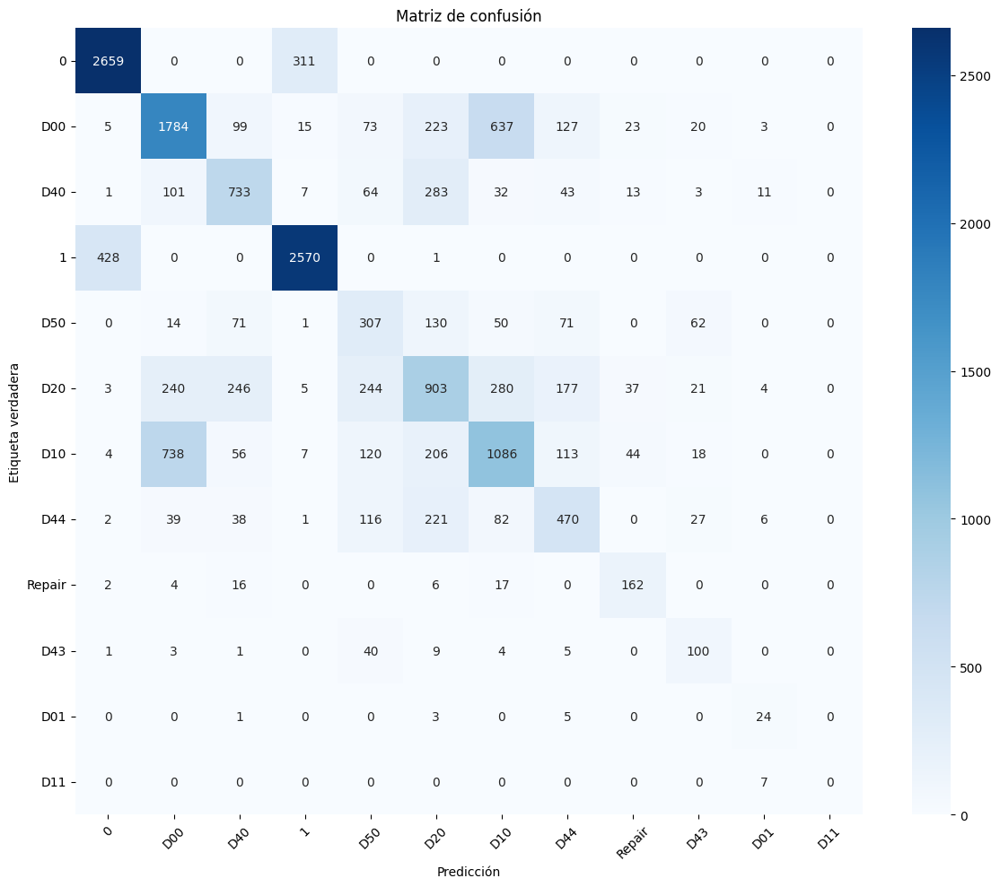

In [134]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

def plot_confusion_matrix(model, val_gen):
    y_true = []
    y_pred = []

    for i in range(len(val_gen)):
        images, labels = val_gen[i]
        class_true = labels['class']
        class_probs = model.predict(images, verbose=0)[1]
        class_preds = np.argmax(class_probs, axis=1)

        y_true.extend(class_true)
        y_pred.extend(class_preds)

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    class_names = [name for name, idx in sorted(val_gen.class_to_idx.items(), key=lambda x: x[1])]
    cm = confusion_matrix(y_true, y_pred, labels=list(range(len(class_names))))

    plt.figure(figsize=(12, 10))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel('Predicción')
    plt.ylabel('Etiqueta verdadera')
    plt.title('Matriz de confusión')
    plt.xticks(rotation=45)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

# Usar la función
plot_confusion_matrix(model, val_gen)


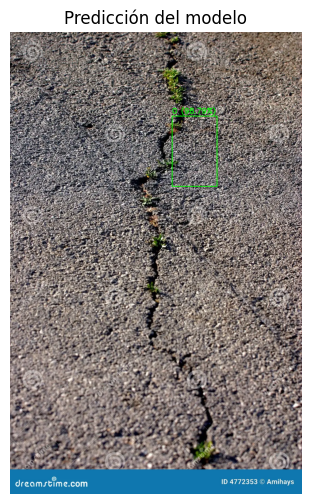

In [138]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def predict_on_image(image_path, model, class_to_idx, img_size=(224, 224)):
    idx_to_class = {v: k for k, v in class_to_idx.items()}

    # Leer y preparar imagen
    img = cv2.imread(image_path)
    if img is None:
        print(f"❌ No se pudo leer la imagen: {image_path}")
        return

    original = img.copy()
    original_h, original_w = img.shape[:2]

    # Preprocesar
    img_resized = cv2.resize(img, img_size)
    img_normalized = img_resized.astype(np.float32) / 255.0
    img_input = np.expand_dims(img_normalized, axis=0)  # batch dimension

    # Hacer predicción
    bbox_pred, class_probs = model.predict(img_input, verbose=0)
    bbox_pred = bbox_pred[0]  # (4,)
    class_probs = class_probs[0]  # (num_classes,)

    class_idx = np.argmax(class_probs)
    class_name = idx_to_class[class_idx]
    confidence = class_probs[class_idx] * 100

    # Bounding box (escalado a tamaño original)
    x_min = int(bbox_pred[0] * original_w)
    y_min = int(bbox_pred[1] * original_h)
    x_max = int(bbox_pred[2] * original_w)
    y_max = int(bbox_pred[3] * original_h)

    # Dibujar resultado
    cv2.rectangle(original, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
    label_text = f"{class_name} ({confidence:.2f}%)"
    cv2.putText(original, label_text, (x_min, y_min - 10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    # Mostrar imagen
    plt.figure(figsize=(8, 6))
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title("Predicción del modelo")
    plt.show()

# Ejemplo de uso
ruta_imagen = r"C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\AI_model\IMG\grieta.webp"
predict_on_image(ruta_imagen, model, class_to_idx, img_size=(224, 224))


In [ ]:
import tensorflow as tf
import os

# Ruta donde guardar el modelo (debe estar vacía o no contener archivos conflictivos)
save_path = r'C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\andorid_app\app\src\main\assets'

# Asegurarse de que la carpeta existe
os.makedirs(save_path, exist_ok=True)

# Exportar como SavedModel (necesario para TFLite)
model.export(save_path)

# Convertir a TFLite
converter = tf.lite.TFLiteConverter.from_saved_model(save_path)
tflite_model = converter.convert()

# Guardar .tflite en la carpeta assets
tflite_output_path = os.path.join(os.path.dirname(save_path), 'modelo_entrenado.tflite')
with open(tflite_output_path, 'wb') as f:
    f.write(tflite_model)

print("✅ Modelo exportado y convertido a TFLite en:", tflite_output_path)


INFO:tensorflow:Assets written to: C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\andorid_app\app\src\main\assets\assets


INFO:tensorflow:Assets written to: C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\andorid_app\app\src\main\assets\assets


Saved artifact at 'C:\Users\marco\AndroidStudioProjects\TFG\TFG-App-IA-IncidenciasViales\code\andorid_app\app\src\main\assets'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_796')
Output Type:
  List[TensorSpec(shape=(None, 4), dtype=tf.float32, name=None), TensorSpec(shape=(None, 13), dtype=tf.float32, name=None)]
Captures:
  2051652068704: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2051742981936: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2051742984224: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2051742980000: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2051742983168: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2051742987216: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2051964257728: TensorSpec(shape=(), dtype=tf.resource, name=None)
  2051742988800: TensorSpec(shape=(), dtype=tf.resource, name=None)
  20517429893

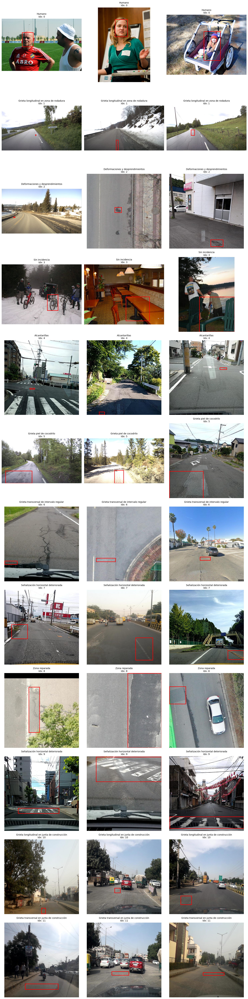

In [143]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def cargar_nombres_clases(path_txt):
    clases_desc = {}
    with open(path_txt, 'r', encoding='utf-8') as f:
        for line in f:
            if line.strip():
                key, desc = line.strip().split('-', 1)
                clases_desc[key.strip()] = desc.strip()
    return clases_desc

def show_examples_por_clase_con_titulo(df, class_to_idx, path_txt, n_examples=3):
    clases_desc = cargar_nombres_clases(path_txt)
    n_classes = len(class_to_idx)
    
    plt.figure(figsize=(n_examples * 5, n_classes * 5))

    for i, (label, idx) in enumerate(class_to_idx.items()):
        subset = df[df['label'] == label]
        if subset.empty:
            continue

        n_show = min(n_examples, len(subset))
        samples = subset.sample(n_show)

        for j, (_, sample) in enumerate(samples.iterrows()):
            img_path = sample['image_path']
            xmin, ymin, xmax, ymax = sample['xmin'], sample['ymin'], sample['xmax'], sample['ymax']

            img = Image.open(img_path)

            ax = plt.subplot(n_classes, n_examples, i * n_examples + j + 1)
            ax.imshow(img)
            rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                     linewidth=2, edgecolor='r', facecolor='none')
            ax.add_patch(rect)

            desc = clases_desc.get(str(label), f"{label} (sin descripción)")
            ax.set_title(f"{desc}\nIdx: {idx}", fontsize=10)
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# Uso
path_clases = 'clases_extraidas.txt'  # Ajusta si está en otra carpeta
show_examples_por_clase_con_titulo(df_balanced, class_to_idx, path_clases, n_examples=3)
